Estimated linear fit: f(delta_cond) = a*conc with
 a = 0.000818±2.8e-5

Estimated linear fit: f(delta_cond) = a*conc with
 a = 0.000812±9.9e-5

Estimated linear fit: f(delta_cond) = a*conc with
 a = 0.000456±5.18e-6

958: 9.700806565484955 sd: 9.842223520028694 530: 8.798080978404498 delta_calib_958: 0.1414169545437396 delta_delta_calib_530: 1.044142541624197 delta_calib_554: 0.006539618492093169

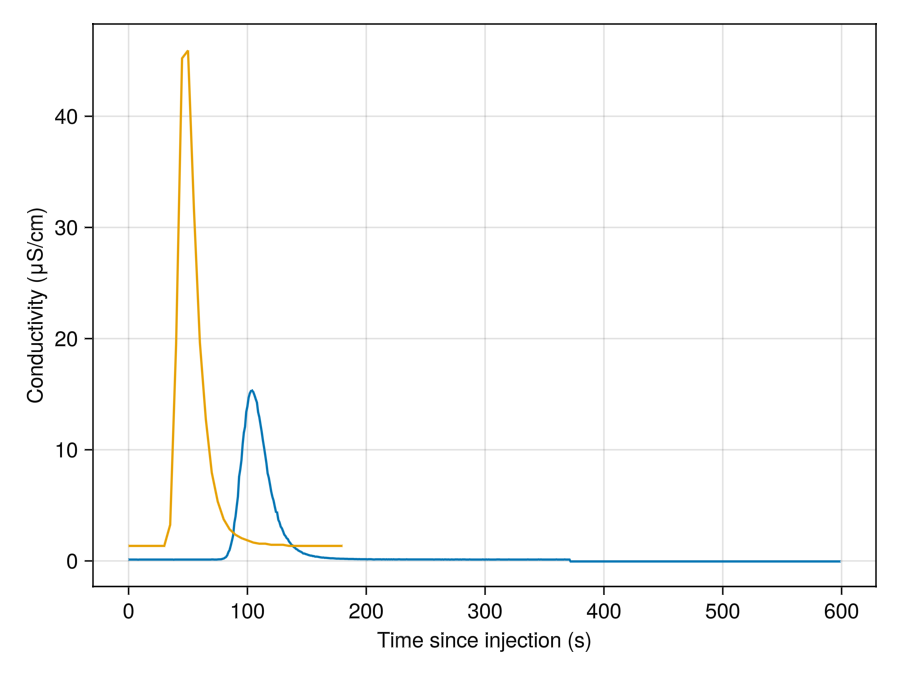

Trace #1 Sensor #2:202.0   Trace #2 Sensor #2:53.0   Trace #3 Sensor #2:45.0   Trace #3 Sensor #1:20.0   Trace #4 Sensor #2:52.0   Trace #4 Sensor #1:40.0   Trace #5 Sensor #2:116.0   Trace #5 Sensor #1:115.0   Trace #6 Sensor #2:46.0   Trace #6 Sensor #1:35.0   Trace #7 Sensor #2:45.0   Trace #7 Sensor #1:30.0   Trace #8 Sensor #2:52.0   Trace #8 Sensor #1:20.0   Trace #9 Sensor #2:200.0   Trace #9 Sensor #1:155.0   Trace #10 Sensor #2:45.0   Trace #10 Sensor #1:50.0   

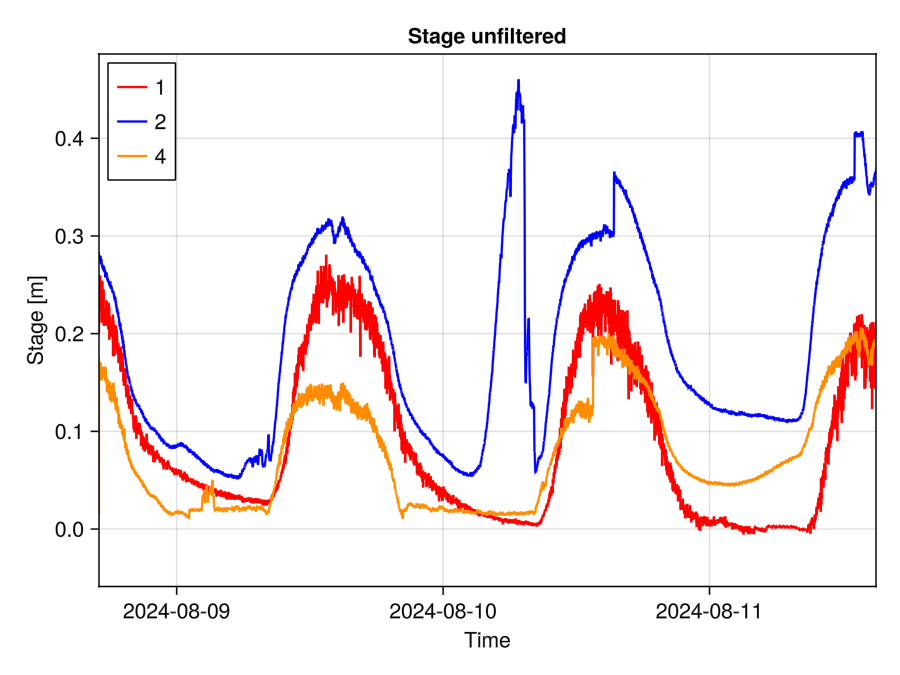

[ Info: Unsafe comparisons using the function `pmean` has been enabled globally. Use `@unsafe` to enable in a local expression only or `unsafe_comparisons(false)` to turn off unsafe comparisons


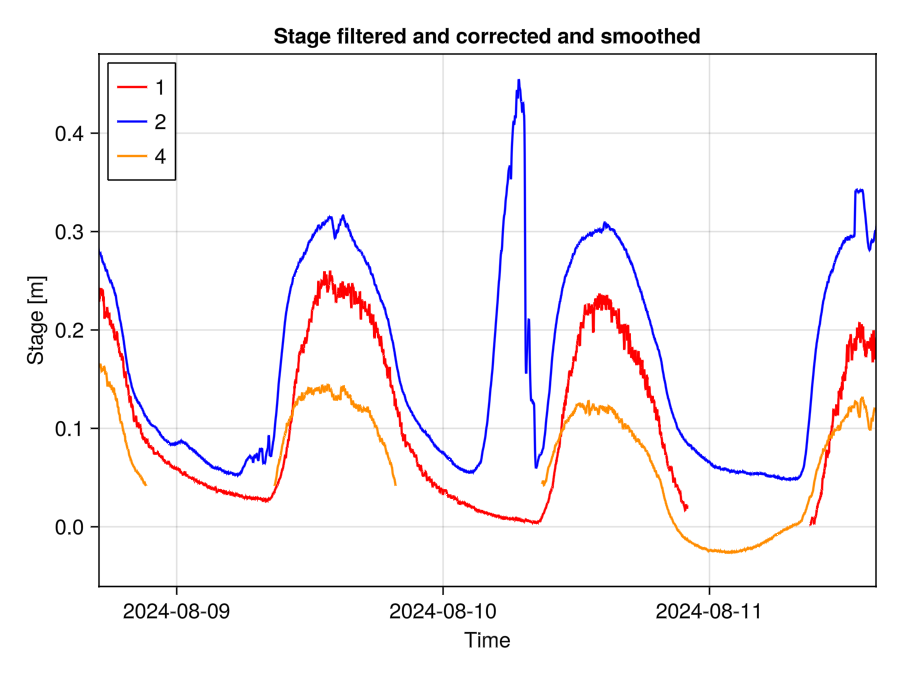

Estimated linear fit sensor 530: Q(s) = a + b*stage with
 a = -0.173 ± 0.049, b = 1.33 ± 0.23

Estimated linear fit sensor 554: Q(s) = a + b*stage with
 a = 0.0523 ± 0.029, b = 2.89 ± 0.25

Estimated linear fit sensor 958: Q(s) = a + b*stage with
 a = 0.0812 ± 0.012, b = 1.17 ± 0.11

Estimated linear fit sensor 554: Q(s) = a + b*stage with
 a = 0.0482 ± 0.023, b = 2.26 ± 0.2

Estimated linear fit sensor 958: Q(s) = a + b*stage with
 a = 0.0735 ± 0.0091, b = 0.872 ± 0.09

0.2280560.007919840.195725Estimated linear fit sensor 1.0: v(s) = a + b*stage with
 a = 0.415, b = 4.72

0.3002190.195124Estimated linear fit sensor 2.0: v(s) = a + b*stage with
 a = 0.0622, b = 2.73

0.1271990.130708Estimated linear fit sensor 4.0: v(s) = a + b*stage with
 a = 1.0, b = 1.25e-10



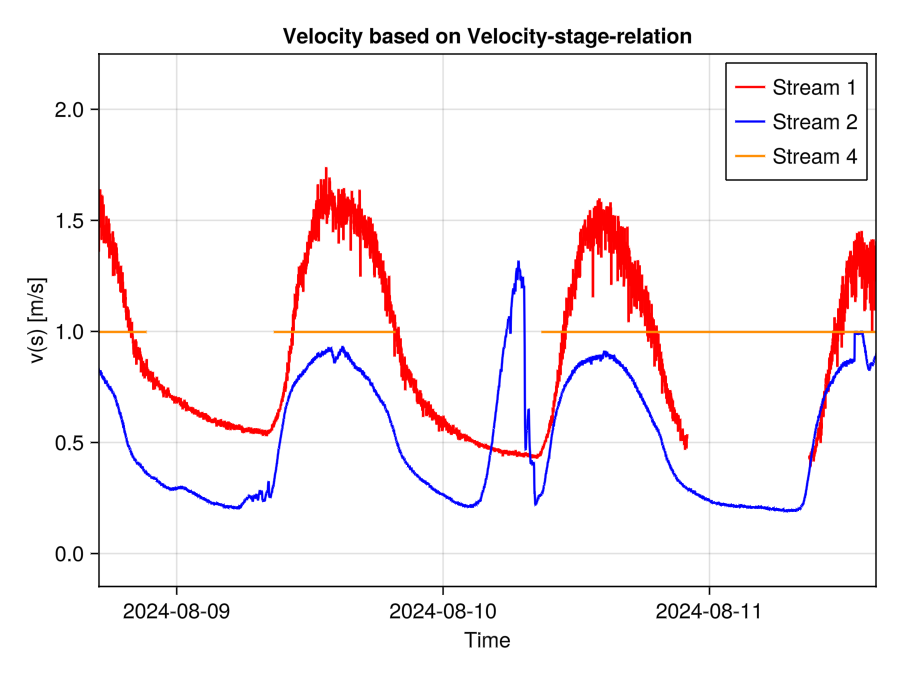

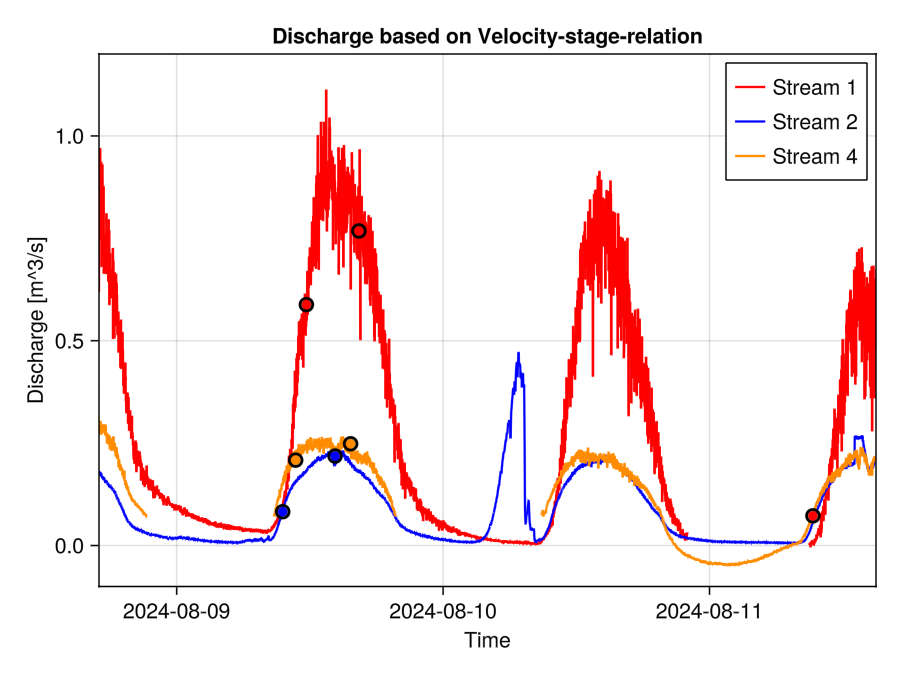

In [1]:
using NBInclude
@nbinclude("5_further_work-uncertainties.ipynb")
using CSV, DataFrames, NamedArrays
using Plots #, GLMakie
using MonteCarloMeasurements, Distributions, Statistics, GLM

## Reading in the data and assigning uncertainties to the values

In [2]:
poly = CSV.read("../data/raw/GISData_raw.csv", DataFrame)
poly.Area = poly.Area ± 0.1.*poly.Area
poly.Perimeter = poly.Perimeter ± 0.02.*poly.Perimeter
poly.MaxDist = poly.MaxDist .± 0.5
poly.Stream = floor.(Int, poly.id)
poly.Section = round.((poly.id .- poly.Stream).*10)
poly.Section = Int.(poly.Section) #different from section of StreamSurvey!!
poly

Row,id,Name,Area,Perimeter,MaxDist,Stream,Section
,Float64,String15,Particle…,Particle…,Particle…,Int64,Int64
1,1.0,01InjCTD,216.0 ± 21.0,270.0 ± 5.3,124.0 ± 0.5,1,0
2,1.1,01InjWTW,91.8 ± 9.2,132.0 ± 2.7,63.7 ± 0.5,1,1
3,1.2,01WTWCTD,125.0 ± 13.0,141.0 ± 2.8,63.2 ± 0.5,1,2
4,2.0,02InjCTD,305.0 ± 31.0,649.0 ± 13.0,289.0 ± 0.5,2,0
5,2.1,02InjWTW,192.0 ± 19.0,451.0 ± 8.9,207.0 ± 0.5,2,1
6,2.2,02WTWCTD,113.0 ± 11.0,200.0 ± 4.1,83.5 ± 0.5,2,2
7,3.0,03InjCTD,129.0 ± 13.0,255.0 ± 4.9,120.0 ± 0.5,3,0
8,3.1,03InjWTW,57.7 ± 5.7,115.0 ± 2.3,52.7 ± 0.5,3,1
9,3.2,03WTWCTD,71.4 ± 7.1,143.0 ± 2.9,67.6 ± 0.5,3,2


In [3]:
StreamSurvey_full = CSV.read("../data/raw/streams_corr.csv", DataFrame) #streamsection: 0 -> above Inj, 1 -> Inj, 2 -> Inj-WTW 3 -> WTW, 4 -> WTW-CTD, 5 -> CTD, 6 -> below CTD
StreamSurvey = StreamSurvey_full[:, ["Stream", "StreamSection", "Order", "Ellh_corr", "Width", "Depth1", "Depth2", "Depth3"]]
StreamSurvey.Ellh_corr = StreamSurvey.Ellh_corr .± StreamSurvey_full."Elevation RMS"
StreamSurvey.Width = StreamSurvey.Width ± 5 
StreamSurvey.Depth1 = StreamSurvey.Depth1 ± 2
StreamSurvey.Depth2 = StreamSurvey.Depth2 ± 2
StreamSurvey.Depth3 = StreamSurvey.Depth3 ± 2

StreamSurvey.Width = StreamSurvey.Width ./ 100 #everything in [m]
StreamSurvey.Depth1 = StreamSurvey.Depth1 ./ 100
StreamSurvey.Depth2 = StreamSurvey.Depth2 ./ 100
StreamSurvey.Depth3 = StreamSurvey.Depth3 ./ 100
StreamSurvey

Row,Stream,StreamSection,Order,Ellh_corr,Width,Depth1,Depth2,Depth3
,Int64,Int64,Int64,Particle…,Particle…,Particle…,Particle…,Particle…
1,2,1,1,2710.0 ± 0.015,0.7 ± 0.05,0.25 ± 0.021,0.28 ± 0.02,0.28 ± 0.02
2,2,2,2,2710.0 ± 0.012,1.1 ± 0.051,0.199 ± 0.02,0.25 ± 0.02,0.22 ± 0.019
3,2,3,3,2710.0 ± 0.019,1.1 ± 0.051,0.151 ± 0.02,0.17 ± 0.02,0.25 ± 0.02
4,2,4,3,2710.0 ± 0.01,1.1 ± 0.052,0.15 ± 0.02,0.17 ± 0.02,0.251 ± 0.02
5,2,4,4,2710.0 ± 0.012,0.8 ± 0.049,0.2 ± 0.02,0.25 ± 0.02,0.219 ± 0.02
6,2,4,5,2710.0 ± 0.016,1.4 ± 0.05,0.27 ± 0.02,0.23 ± 0.02,0.21 ± 0.02
7,2,4,6,2710.0 ± 0.014,0.801 ± 0.05,0.201 ± 0.02,0.25 ± 0.021,0.22 ± 0.02
8,2,5,7,2710.0 ± 0.019,1.0 ± 0.05,0.301 ± 0.02,0.301 ± 0.02,0.21 ± 0.02
9,3,0,1,2710.0 ± 0.023,1.45 ± 0.05,0.23 ± 0.02,0.28 ± 0.02,0.25 ± 0.019


In [4]:
#traces from 5_...uncertainties
traces.t_WTWCTD = traces.t2 .- traces.t1
rename!(traces, :t1 => :t_InjWTW)
rename!(traces, :t2 => :t_InjCTD)

Row,loc,t_inj,Q1,Q2,t_InjWTW,t_InjCTD,t_WTWCTD
,Int64,DateTime,Particle…,Particle…,Particle…,Particle…,Particle…
1,1,2024-08-09T11:41:00,0.47 ± 0.047,0.59 ± 0.059,49.9 ± 4.9,104.0 ± 2.0,54.1 ± 5.3
2,1,2024-08-09T16:25:06,0.61 ± 0.061,0.77 ± 0.077,30.0 ± 4.9,88.0 ± 2.0,58.0 ± 5.3
3,1,2024-08-11T09:18:35,0.065 ± 0.0065,0.074 ± 0.0074,115.0 ± 4.9,293.0 ± 2.0,178.0 ± 5.3
4,2,2024-08-09T09:32:50,NaN ± NaN,0.084 ± 0.0084,NaN ± NaN,544.0 ± 2.0,NaN ± NaN
5,2,2024-08-09T14:15:14,0.14 ± 0.014,0.22 ± 0.022,160.0 ± 5.0,367.0 ± 2.0,207.0 ± 5.3
6,3,2024-08-09T10:11:00,NaN ± NaN,0.18 ± 0.018,NaN ± NaN,130.0 ± 2.0,NaN ± NaN
7,3,2024-08-09T14:59:25,0.23 ± 0.023,0.29 ± 0.029,39.9 ± 5.0,99.0 ± 2.0,59.1 ± 5.4
8,4,2024-08-09T10:42:30,0.15 ± 0.015,0.21 ± 0.021,15.1 ± 5.0,121.0 ± 2.0,106.0 ± 5.4
9,4,2024-08-09T15:40:05,0.22 ± 0.022,0.25 ± 0.025,20.2 ± 5.1,121.0 ± 2.0,101.0 ± 5.5


## Calculate derived values
### StreamSurvey
Calculate Average depth per measurement location

Calculate Aspect Ratio = measured width / measured avg depth

In [5]:
StreamSurvey."Depth_avg" = (StreamSurvey.Depth1 + StreamSurvey.Depth2 +StreamSurvey.Depth3)/3;
StreamSurvey.AR_measured = StreamSurvey.Width ./ StreamSurvey."Depth_avg"
StreamSurvey

Row,Stream,StreamSection,Order,Ellh_corr,Width,Depth1,Depth2,Depth3,Depth_avg,AR_measured
,Int64,Int64,Int64,Particle…,Particle…,Particle…,Particle…,Particle…,Particle…,Particle…
1,2,1,1,2710.0 ± 0.015,0.7 ± 0.05,0.25 ± 0.021,0.28 ± 0.02,0.28 ± 0.02,0.27 ± 0.012,2.6 ± 0.22
2,2,2,2,2710.0 ± 0.012,1.1 ± 0.051,0.199 ± 0.02,0.25 ± 0.02,0.22 ± 0.019,0.223 ± 0.012,4.96 ± 0.34
3,2,3,3,2710.0 ± 0.019,1.1 ± 0.051,0.151 ± 0.02,0.17 ± 0.02,0.25 ± 0.02,0.19 ± 0.012,5.8 ± 0.44
4,2,4,3,2710.0 ± 0.01,1.1 ± 0.052,0.15 ± 0.02,0.17 ± 0.02,0.251 ± 0.02,0.19 ± 0.011,5.79 ± 0.44
5,2,4,4,2710.0 ± 0.012,0.8 ± 0.049,0.2 ± 0.02,0.25 ± 0.02,0.219 ± 0.02,0.223 ± 0.011,3.59 ± 0.29
6,2,4,5,2710.0 ± 0.016,1.4 ± 0.05,0.27 ± 0.02,0.23 ± 0.02,0.21 ± 0.02,0.237 ± 0.012,5.93 ± 0.36
7,2,4,6,2710.0 ± 0.014,0.801 ± 0.05,0.201 ± 0.02,0.25 ± 0.021,0.22 ± 0.02,0.223 ± 0.012,3.59 ± 0.29
8,2,5,7,2710.0 ± 0.019,1.0 ± 0.05,0.301 ± 0.02,0.301 ± 0.02,0.21 ± 0.02,0.27 ± 0.012,3.71 ± 0.25
9,3,0,1,2710.0 ± 0.023,1.45 ± 0.05,0.23 ± 0.02,0.28 ± 0.02,0.25 ± 0.019,0.253 ± 0.011,5.73 ± 0.32


### poly
FlowLength

Sinuosity

Average Width based on Area

DeltaH

Average Width based on in-situ measurements

Average Depth based on in-situ measurements

Aspect Ratio based on in-situ measurements

Aspect Ratio based on in-situ depth, Remote Sensing Width

In [6]:
poly.FlowLength = (poly.Perimeter .- 2) ./2
poly.Sinu = poly.FlowLength ./ poly.MaxDist
poly.W_avg_A = poly.Area ./ poly.FlowLength;

In [7]:
function DeltaH(streamx, upper, lower) #calculates delta of Ellh_corr of two points
    h_upper = StreamSurvey[(StreamSurvey.Stream .== streamx) .&& (StreamSurvey.StreamSection .== upper), "Ellh_corr"][1] #first element bc output is a 1-element vector
    h_lower = StreamSurvey[(StreamSurvey.Stream .== streamx) .&& (StreamSurvey.StreamSection .== lower), "Ellh_corr"][1]
    dh = h_upper - h_lower
    if upper > lower
        print("Got upper and lower wrong?") #check for wrong input
    end
    if dh < 0
        print("delta < 0!") #check for wrong data
        end
    return dh
end

function Section_average(streamx, sections, variable) #calculates average of given sections of a given variable in the StreamSurvey df
    vect = StreamSurvey[(StreamSurvey.Stream .== streamx) .&& map(s -> s in sections, StreamSurvey.StreamSection), variable]
    avg = mean(vect)
    return avg
end;

In [8]:
#calculates DeltaH of all the sections in poly
#calculates average width and depth of all the sections in poly

poly.DeltaH = [0.0 ± 0.0 for _ in 1:15]
poly.W_avg_measured = [0.0 ± 0.0 for _ in 1:15]
poly.Depth_avg = [0.0 ± 0.0 for _ in 1:15]
poly.AR_measured = [0.0 ± 0.0 for _ in 1:15]

for i in 1:length(poly.id)
    stream = poly.Stream[i] #extracts stream number
    section = poly.Section[i] #extracts section 
    if section == 0
        d = DeltaH(stream, 1, 5)
        w = Section_average(stream, [1, 2, 3, 4, 5], "Width")
        depth = Section_average(stream, [1, 2, 3, 4, 5], "Depth_avg")
        AR = Section_average(stream, [1, 2, 3, 4, 5], "AR_measured")
    end 
    if section == 1
        d = DeltaH(stream, 1, 3)
        w = Section_average(stream, [1, 2, 3], "Width")
        depth = Section_average(stream, [1, 2, 3], "Depth_avg")
        AR = Section_average(stream, [1, 2, 3], "AR_measured")
    end
    if section == 2
        d = DeltaH(stream, 3, 5)
        w = Section_average(stream, [3, 4, 5], "Width")
        depth = Section_average(stream, [3, 4, 5], "Depth_avg")
        AR = Section_average(stream, [3, 4, 5], "AR_measured")
    end
    poly.DeltaH[i] = d
    poly.W_avg_measured[i] = w
    poly.Depth_avg[i] = depth
    poly.AR_measured[i] = AR
end;

In [9]:
poly.Grad_straight = poly.DeltaH ./ poly.MaxDist
poly.Grad_flow = poly.DeltaH ./ poly.FlowLength
poly.AR_A = poly.W_avg_A ./ poly.Depth_avg;

### traces
calculate velocities and Hydraulic Diameter Dhyd

In [10]:
#initialise vectors
traces.v_InjWTW = [0.0 ± 0.0 for _ in 1:length(traces.loc)]
traces.v_InjCTD = [0.0 ± 0.0 for _ in 1:length(traces.loc)]
traces.v_WTWCTD = [0.0 ± 0.0 for _ in 1:length(traces.loc)]
traces.Dhyd_InjWTW = [0.0 ± 0.0 for _ in 1:length(traces.loc)]
traces.Dhyd_InjCTD = [0.0 ± 0.0 for _ in 1:length(traces.loc)]
traces.Dhyd_WTWCTD = [0.0 ± 0.0 for _ in 1:length(traces.loc)]
traces.f_InjWTW = [0.0 ± 0.0 for _ in 1:length(traces.loc)]
traces.f_InjCTD = [0.0 ± 0.0 for _ in 1:length(traces.loc)]
traces.f_WTWCTD = [0.0 ± 0.0 for _ in 1:length(traces.loc)]

j = 1 #counter

for i in traces.loc #i iterates through stream numbers, j through rows of traces
    traces.v_InjWTW[j] = poly.FlowLength[poly.Stream .== i .&& poly.Section .== 1][1] ./ traces.t_InjWTW[j]
    traces.v_InjCTD[j] = poly.FlowLength[poly.Stream .== i .&& poly.Section .== 0][1] ./ traces.t_InjCTD[j]
    traces.v_WTWCTD[j] = poly.FlowLength[poly.Stream .== i .&& poly.Section .== 2][1] ./ traces.t_WTWCTD[j]

    traces.Dhyd_InjWTW[j] = 4 * traces.Q1[j] / traces.v_InjWTW[j] / ((poly.W_avg_measured[poly.Stream .== i .&& poly.Section .== 1][1] + 2 * poly.Depth_avg[poly.Stream .== i .&& poly.Section .== 1][1])) #take Q1 for section InjWTW
    traces.Dhyd_InjCTD[j] = 4 * (traces.Q1[j]+traces.Q2[j])/2 / traces.v_InjCTD[j] / ((poly.W_avg_measured[poly.Stream .== i .&& poly.Section .== 0][1] + 2 * poly.Depth_avg[poly.Stream .== i .&& poly.Section .== 0][1])) #take avg of Q1 and Q2 for whole stream
    traces.Dhyd_WTWCTD[j] = 4 * traces.Q2[j] / traces.v_WTWCTD[j] / ((poly.W_avg_measured[poly.Stream .== i .&& poly.Section .== 2][1] + 2 * poly.Depth_avg[poly.Stream .== i .&& poly.Section .== 2][1])) #take Q2 for section WTWCTD

    traces.f_InjWTW[j] = poly.Grad_flow[poly.Stream .== i .&& poly.Section .== 1][1] * traces.Dhyd_InjWTW[j] * 2 * 9.81 / (traces.v_InjWTW[j])^2
    traces.f_InjCTD[j] = poly.Grad_flow[poly.Stream .== i .&& poly.Section .== 0][1] * traces.Dhyd_InjCTD[j] * 2 * 9.81 / (traces.v_InjCTD[j])^2
    traces.f_WTWCTD[j] = poly.Grad_flow[poly.Stream .== i .&& poly.Section .== 2][1] * traces.Dhyd_WTWCTD[j] * 2 * 9.81 / (traces.v_WTWCTD[j])^2
    
    j += 1
end

traces

Row,loc,t_inj,Q1,Q2,t_InjWTW,t_InjCTD,t_WTWCTD,v_InjWTW,v_InjCTD,v_WTWCTD,Dhyd_InjWTW,Dhyd_InjCTD,Dhyd_WTWCTD,f_InjWTW,f_InjCTD,f_WTWCTD
,Int64,DateTime,Particle…,Particle…,Particle…,Particle…,Particle…,Particle…,Particle…,Particle…,Particle…,Particle…,Particle…,Particle…,Particle…,Particle…
1,1,2024-08-09T11:41:00,0.47 ± 0.047,0.59 ± 0.059,49.9 ± 4.9,104.0 ± 2.0,54.1 ± 5.3,1.32 ± 0.14,1.29 ± 0.036,1.3 ± 0.13,0.667 ± 0.095,0.701 ± 0.054,0.738 ± 0.11,0.158 ± 0.05,0.193 ± 0.024,0.236 ± 0.076
2,1,2024-08-09T16:25:06,0.61 ± 0.061,0.77 ± 0.077,30.0 ± 4.9,88.0 ± 2.0,58.0 ± 5.3,2.23 ± 0.41,1.52 ± 0.046,1.21 ± 0.11,0.521 ± 0.1,0.772 ± 0.06,1.03 ± 0.14,0.047 ± 0.024,0.152 ± 0.019,0.377 ± 0.12
3,1,2024-08-11T09:18:35,0.065 ± 0.0065,0.074 ± 0.0074,115.0 ± 4.9,293.0 ± 2.0,178.0 ± 5.3,0.568 ± 0.027,0.457 ± 0.0095,0.39 ± 0.014,0.213 ± 0.024,0.259 ± 0.019,0.304 ± 0.033,0.261 ± 0.048,0.565 ± 0.061,1.03 ± 0.16
4,2,2024-08-09T09:32:50,NaN ± NaN,0.084 ± 0.0084,NaN ± NaN,544.0 ± 2.0,NaN ± NaN,NaN ± NaN,0.595 ± 0.012,NaN ± NaN,NaN ± NaN,NaN ± NaN,NaN ± NaN,NaN ± NaN,NaN ± NaN,NaN ± NaN
5,2,2024-08-09T14:15:14,0.14 ± 0.014,0.22 ± 0.022,160.0 ± 5.0,367.0 ± 2.0,207.0 ± 5.3,1.4 ± 0.051,0.882 ± 0.018,0.48 ± 0.016,0.281 ± 0.031,0.561 ± 0.042,1.24 ± 0.13,0.0225 ± 0.0037,0.192 ± 0.021,2.79 ± 0.42
6,3,2024-08-09T10:11:00,NaN ± NaN,0.18 ± 0.018,NaN ± NaN,130.0 ± 2.0,NaN ± NaN,NaN ± NaN,0.974 ± 0.024,NaN ± NaN,NaN ± NaN,NaN ± NaN,NaN ± NaN,NaN ± NaN,NaN ± NaN,NaN ± NaN
7,3,2024-08-09T14:59:25,0.23 ± 0.023,0.29 ± 0.029,39.9 ± 5.0,99.0 ± 2.0,59.1 ± 5.4,1.43 ± 0.19,1.28 ± 0.036,1.2 ± 0.11,0.463 ± 0.076,0.562 ± 0.044,0.653 ± 0.088,0.177 ± 0.071,0.215 ± 0.027,0.255 ± 0.075
8,4,2024-08-09T10:42:30,0.15 ± 0.015,0.21 ± 0.021,15.1 ± 5.0,121.0 ± 2.0,106.0 ± 5.4,2.22 ± 2.2,1.0 ± 0.026,0.878 ± 0.049,0.185 ± 0.065,0.443 ± 0.034,0.602 ± 0.069,0.0582 ± 0.054,0.257 ± 0.03,0.4 ± 0.08
9,4,2024-08-09T15:40:05,0.22 ± 0.022,0.25 ± 0.025,20.2 ± 5.1,121.0 ± 2.0,101.0 ± 5.5,1.52 ± 0.58,1.0 ± 0.026,0.923 ± 0.054,0.365 ± 0.1,0.578 ± 0.045,0.682 ± 0.08,0.184 ± 0.13,0.336 ± 0.04,0.41 ± 0.087


In [11]:
# add velocities to poly
poly.v_t1 = [0.0 ± 0.0 for _ in 1:length(poly.id)]
poly.v_t2 = [0.0 ± 0.0 for _ in 1:length(poly.id)]
poly.v_t3 = [0.0 ± 0.0 for _ in 1:length(poly.id)]

for i in traces.loc #i iterates through streams
    poly.v_t1[poly.Stream .== i] = [traces.v_InjCTD[traces.loc .== i][1], traces.v_InjWTW[traces.loc .== i][1], traces.v_WTWCTD[traces.loc .== i][1]]
    
     v2_values = [0.0 ± 0.0 for _ in 1:3]
    # Check and assign the values one by one, setting NaN if out of range
    v2_values[1] = (length(traces.v_InjCTD[traces.loc .== i]) >= 2) ? traces.v_InjCTD[traces.loc .== i][2] : NaN
    v2_values[2] = (length(traces.v_InjWTW[traces.loc .== i]) >= 2) ? traces.v_InjWTW[traces.loc .== i][2] : NaN
    v2_values[3] = (length(traces.v_WTWCTD[traces.loc .== i]) >= 2) ? traces.v_WTWCTD[traces.loc .== i][2] : NaN
    # Assign the v2 values to the correct rows in poly
    poly.v_t2[poly.Stream .== i] .= v2_values

    v3_values = [0.0 ± 0.0 for _ in 1:3]
    # Check and assign the values one by one, setting NaN if out of range
    v3_values[1] = (length(traces.v_InjCTD[traces.loc .== i]) >= 3) ? traces.v_InjCTD[traces.loc .== i][3] : NaN
    v3_values[2] = (length(traces.v_InjWTW[traces.loc .== i]) >= 3) ? traces.v_InjWTW[traces.loc .== i][3] : NaN
    v3_values[3] = (length(traces.v_WTWCTD[traces.loc .== i]) >= 3) ? traces.v_WTWCTD[traces.loc .== i][3] : NaN
    # Assign the v2 values to the correct rows in poly
    poly.v_t3[poly.Stream .== i] .= v3_values


end
poly
    

Row,id,Name,Area,Perimeter,MaxDist,Stream,Section,FlowLength,Sinu,W_avg_A,DeltaH,W_avg_measured,Depth_avg,AR_measured,Grad_straight,Grad_flow,AR_A,v_t1,v_t2,v_t3
,Float64,String15,Particle…,Particle…,Particle…,Int64,Int64,Particle…,Particle…,Particle…,Particle…,Particle…,Particle…,Particle…,Particle…,Particle…,Particle…,Particle…,Particle…,Particle…
1,1.0,01InjCTD,216.0 ± 21.0,270.0 ± 5.3,124.0 ± 0.5,1,0,134.0 ± 2.6,1.08 ± 0.022,1.61 ± 0.16,3.1 ± 0.021,1.7 ± 0.016,0.325 ± 0.0036,5.41 ± 0.085,0.0251 ± 0.0002,0.0232 ± 0.00048,4.97 ± 0.49,1.29 ± 0.036,1.52 ± 0.046,0.457 ± 0.0095
2,1.1,01InjWTW,91.8 ± 9.2,132.0 ± 2.7,63.7 ± 0.5,1,1,65.2 ± 1.3,1.02 ± 0.023,1.41 ± 0.14,1.3 ± 0.024,1.46 ± 0.022,0.349 ± 0.0051,4.24 ± 0.092,0.0204 ± 0.0004,0.02 ± 0.00055,4.03 ± 0.42,1.32 ± 0.14,2.23 ± 0.41,0.568 ± 0.027
3,1.2,01WTWCTD,125.0 ± 13.0,141.0 ± 2.8,63.2 ± 0.5,1,2,69.4 ± 1.4,1.1 ± 0.024,1.8 ± 0.19,1.8 ± 0.022,1.87 ± 0.02,0.314 ± 0.0047,6.13 ± 0.12,0.0285 ± 0.00041,0.026 ± 0.00061,5.71 ± 0.61,1.3 ± 0.13,1.21 ± 0.11,0.39 ± 0.014
4,2.0,02InjCTD,305.0 ± 31.0,649.0 ± 13.0,289.0 ± 0.5,2,0,324.0 ± 6.5,1.12 ± 0.022,0.944 ± 0.097,4.38 ± 0.024,1.0 ± 0.017,0.228 ± 0.0042,4.5 ± 0.12,0.0151 ± 8.8e-5,0.0135 ± 0.00028,4.13 ± 0.43,0.595 ± 0.012,0.882 ± 0.018,NaN ± NaN
5,2.1,02InjWTW,192.0 ± 19.0,451.0 ± 8.9,207.0 ± 0.5,2,1,225.0 ± 4.4,1.08 ± 0.022,0.854 ± 0.089,1.79 ± 0.024,0.967 ± 0.029,0.228 ± 0.0069,4.45 ± 0.2,0.00865 ± 0.00012,0.00797 ± 0.00019,3.75 ± 0.41,NaN ± NaN,1.4 ± 0.051,NaN ± NaN
6,2.2,02WTWCTD,113.0 ± 11.0,200.0 ± 4.1,83.5 ± 0.5,2,2,99.2 ± 2.1,1.19 ± 0.026,1.14 ± 0.12,2.59 ± 0.027,1.03 ± 0.021,0.222 ± 0.0047,4.74 ± 0.14,0.031 ± 0.00037,0.0261 ± 0.00062,5.13 ± 0.54,NaN ± NaN,0.48 ± 0.016,NaN ± NaN
7,3.0,03InjCTD,129.0 ± 13.0,255.0 ± 4.9,120.0 ± 0.5,3,0,127.0 ± 2.5,1.05 ± 0.021,1.02 ± 0.11,4.01 ± 0.028,0.906 ± 0.018,0.271 ± 0.0041,3.36 ± 0.086,0.0334 ± 0.00027,0.0317 ± 0.00065,3.77 ± 0.4,0.974 ± 0.024,1.28 ± 0.036,NaN ± NaN
8,3.1,03InjWTW,57.7 ± 5.7,115.0 ± 2.3,52.7 ± 0.5,3,1,56.3 ± 1.1,1.07 ± 0.023,1.02 ± 0.1,2.07 ± 0.025,0.875 ± 0.025,0.268 ± 0.0057,3.27 ± 0.12,0.0393 ± 0.00062,0.0368 ± 0.00085,3.82 ± 0.39,NaN ± NaN,1.43 ± 0.19,NaN ± NaN
9,3.2,03WTWCTD,71.4 ± 7.1,143.0 ± 2.9,67.6 ± 0.5,3,2,70.5 ± 1.4,1.04 ± 0.022,1.01 ± 0.1,1.94 ± 0.021,0.94 ± 0.022,0.274 ± 0.0053,3.44 ± 0.11,0.0288 ± 0.00037,0.0276 ± 0.00064,3.7 ± 0.38,NaN ± NaN,1.2 ± 0.11,NaN ± NaN


In [72]:
function nanmeanMC(x) # Filter out NaN values and calculate the mean of the remaining values for MC particles
    return mean(x[.!isnan.(mean_object(x))])
end

function nanmaxMC(x) # Filter out NaN values and calculate the max of the remaining values for MC particles
    return maximum(x[.!isnan.(mean_object(x))])
end

#add mean values to poly
poly.Q_mean = [NaN ± 0.0 for _ in 1:length(poly.id)]
poly.Q_max = [NaN ± 0.0 for _ in 1:length(poly.id)]
df_names = [sq1, sq2, sq2, sq4]
for i in [1, 2, 4]
    if i != 2
        poly.Q_mean[poly.Stream .== i .&& poly.Section .== 0] = ([nanmeanMC((df_names[i][:q1]))] + [nanmeanMC((df_names[i][:q2]))]) / 2
        poly.Q_mean[poly.Stream .== i .&& poly.Section .== 1] = [nanmeanMC((df_names[i][:q1]))] #InjWTW aka upper section
        poly.Q_max[poly.Stream .== i .&& poly.Section .== 0] = ([nanmaxMC((df_names[i][:q1]))] + [nanmaxMC((df_names[i][:q2]))]) / 2
        poly.Q_max[poly.Stream .== i .&& poly.Section .== 1] = [nanmaxMC((df_names[i][:q1]))]
    end
    poly.Q_mean[poly.Stream .== i .&& poly.Section .== 2] = [nanmeanMC((df_names[i][:q2]))]
    poly.Q_max[poly.Stream .== i .&& poly.Section .== 2] = [nanmaxMC((df_names[i][:q2]))]
end# 0 is InjCTD
poly

Row,id,Name,Area,Perimeter,MaxDist,Stream,Section,FlowLength,Sinu,W_avg_A,DeltaH,W_avg_measured,Depth_avg,AR_measured,Grad_straight,Grad_flow,AR_A,v_t1,v_t2,v_t3,Q_mean,Q_max
,Float64,String15,Particle…,Particle…,Particle…,Int64,Int64,Particle…,Particle…,Particle…,Particle…,Particle…,Particle…,Particle…,Particle…,Particle…,Particle…,Particle…,Particle…,Particle…,Particle…,Particle…
1,1.0,01InjCTD,216.0 ± 21.0,270.0 ± 5.3,124.0 ± 0.5,1,0,134.0 ± 2.6,1.08 ± 0.022,1.61 ± 0.16,3.1 ± 0.021,1.7 ± 0.016,0.325 ± 0.0036,5.41 ± 0.085,0.0251 ± 0.0002,0.0232 ± 0.00048,4.97 ± 0.49,1.29 ± 0.036,1.52 ± 0.046,0.457 ± 0.0095,0.312 ± 0.014,0.991 ± 0.055
2,1.1,01InjWTW,91.8 ± 9.2,132.0 ± 2.7,63.7 ± 0.5,1,1,65.2 ± 1.3,1.02 ± 0.023,1.41 ± 0.14,1.3 ± 0.024,1.46 ± 0.022,0.349 ± 0.0051,4.24 ± 0.092,0.0204 ± 0.0004,0.02 ± 0.00055,4.03 ± 0.42,1.32 ± 0.14,2.23 ± 0.41,0.568 ± 0.027,0.278 ± 0.017,0.875 ± 0.068
3,1.2,01WTWCTD,125.0 ± 13.0,141.0 ± 2.8,63.2 ± 0.5,1,2,69.4 ± 1.4,1.1 ± 0.024,1.8 ± 0.19,1.8 ± 0.022,1.87 ± 0.02,0.314 ± 0.0047,6.13 ± 0.12,0.0285 ± 0.00041,0.026 ± 0.00061,5.71 ± 0.61,1.3 ± 0.13,1.21 ± 0.11,0.39 ± 0.014,0.346 ± 0.022,1.11 ± 0.086
4,2.0,02InjCTD,305.0 ± 31.0,649.0 ± 13.0,289.0 ± 0.5,2,0,324.0 ± 6.5,1.12 ± 0.022,0.944 ± 0.097,4.38 ± 0.024,1.0 ± 0.017,0.228 ± 0.0042,4.5 ± 0.12,0.0151 ± 8.8e-5,0.0135 ± 0.00028,4.13 ± 0.43,0.595 ± 0.012,0.882 ± 0.018,NaN ± NaN,NaN ± NaN,NaN ± NaN
5,2.1,02InjWTW,192.0 ± 19.0,451.0 ± 8.9,207.0 ± 0.5,2,1,225.0 ± 4.4,1.08 ± 0.022,0.854 ± 0.089,1.79 ± 0.024,0.967 ± 0.029,0.228 ± 0.0069,4.45 ± 0.2,0.00865 ± 0.00012,0.00797 ± 0.00019,3.75 ± 0.41,NaN ± NaN,1.4 ± 0.051,NaN ± NaN,NaN ± NaN,NaN ± NaN
6,2.2,02WTWCTD,113.0 ± 11.0,200.0 ± 4.1,83.5 ± 0.5,2,2,99.2 ± 2.1,1.19 ± 0.026,1.14 ± 0.12,2.59 ± 0.027,1.03 ± 0.021,0.222 ± 0.0047,4.74 ± 0.14,0.031 ± 0.00037,0.0261 ± 0.00062,5.13 ± 0.54,NaN ± NaN,0.48 ± 0.016,NaN ± NaN,0.0334 ± 0.014,0.439 ± 0.059
7,3.0,03InjCTD,129.0 ± 13.0,255.0 ± 4.9,120.0 ± 0.5,3,0,127.0 ± 2.5,1.05 ± 0.021,1.02 ± 0.11,4.01 ± 0.028,0.906 ± 0.018,0.271 ± 0.0041,3.36 ± 0.086,0.0334 ± 0.00027,0.0317 ± 0.00065,3.77 ± 0.4,0.974 ± 0.024,1.28 ± 0.036,NaN ± NaN,NaN ± NaN,NaN ± NaN
8,3.1,03InjWTW,57.7 ± 5.7,115.0 ± 2.3,52.7 ± 0.5,3,1,56.3 ± 1.1,1.07 ± 0.023,1.02 ± 0.1,2.07 ± 0.025,0.875 ± 0.025,0.268 ± 0.0057,3.27 ± 0.12,0.0393 ± 0.00062,0.0368 ± 0.00085,3.82 ± 0.39,NaN ± NaN,1.43 ± 0.19,NaN ± NaN,NaN ± NaN,NaN ± NaN
9,3.2,03WTWCTD,71.4 ± 7.1,143.0 ± 2.9,67.6 ± 0.5,3,2,70.5 ± 1.4,1.04 ± 0.022,1.01 ± 0.1,1.94 ± 0.021,0.94 ± 0.022,0.274 ± 0.0053,3.44 ± 0.11,0.0288 ± 0.00037,0.0276 ± 0.00064,3.7 ± 0.38,NaN ± NaN,1.2 ± 0.11,NaN ± NaN,NaN ± NaN,NaN ± NaN


## Start the plotting fun

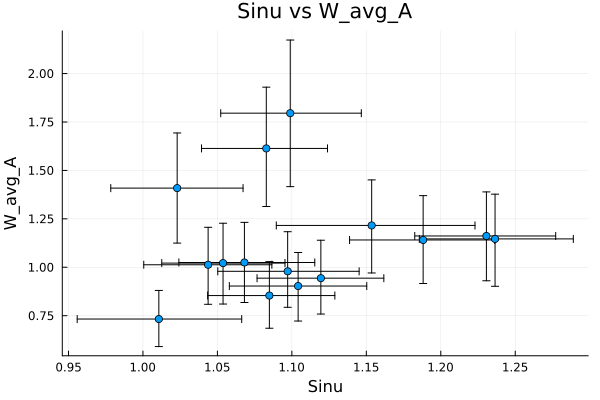

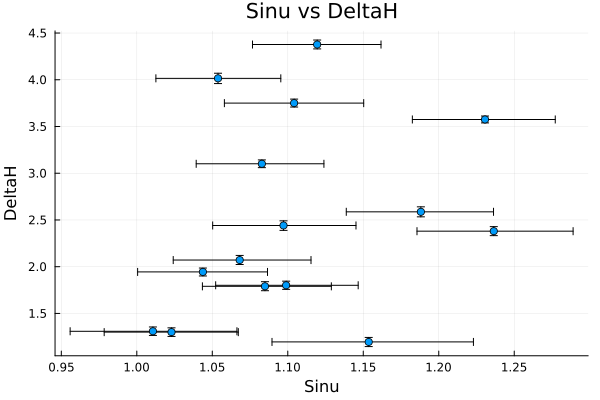

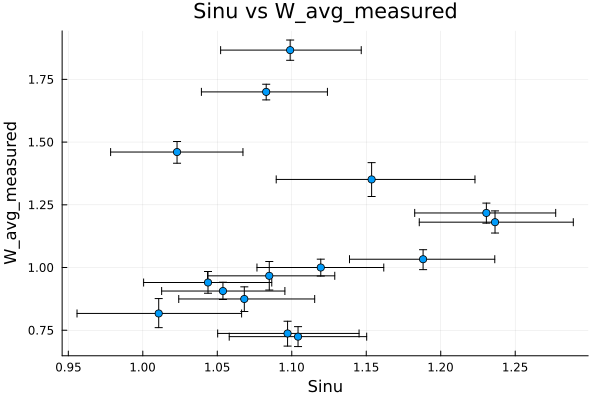

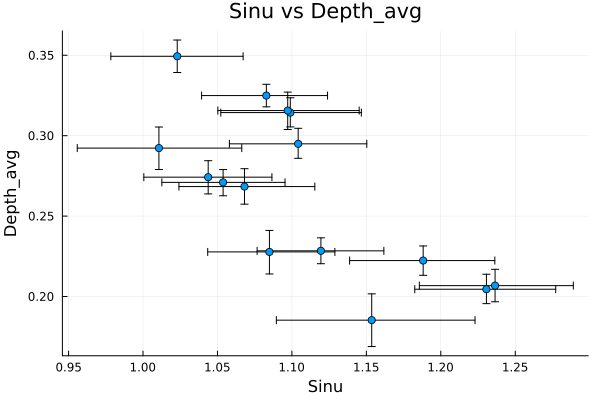

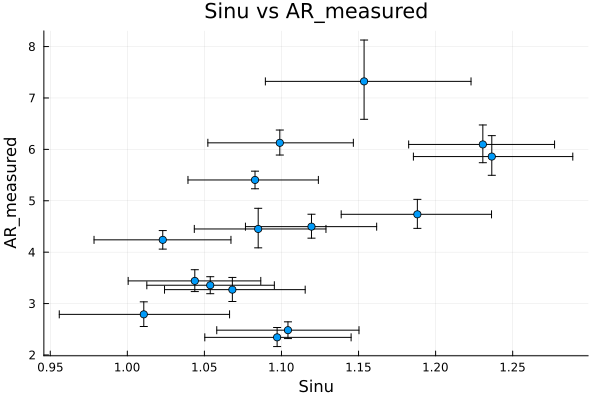

...

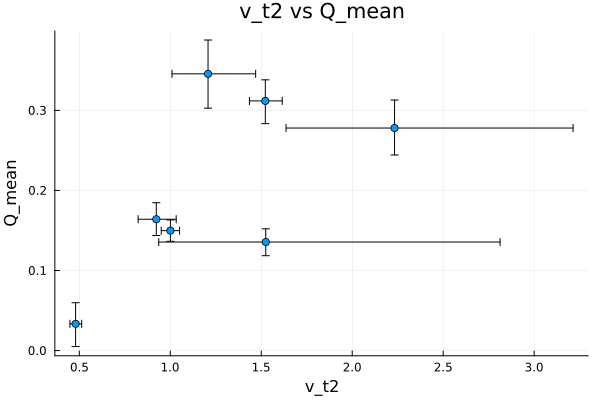

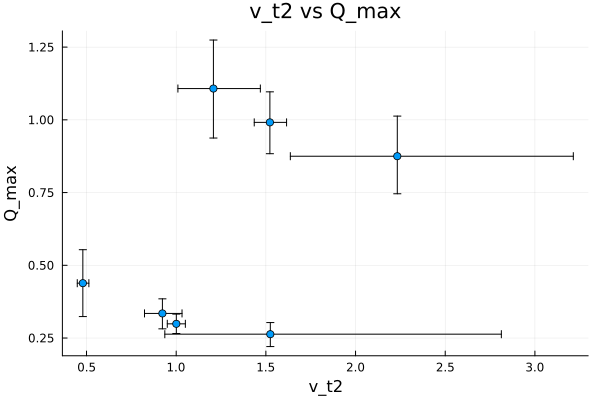

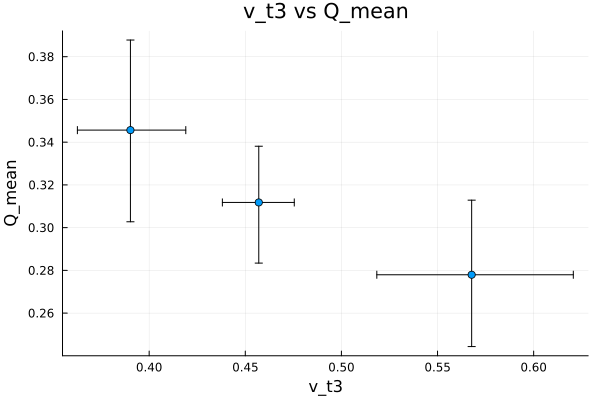

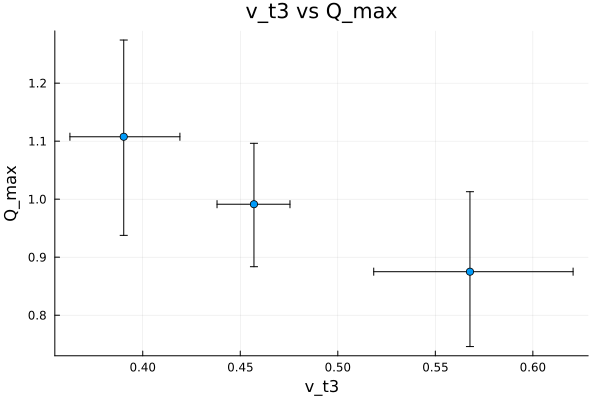

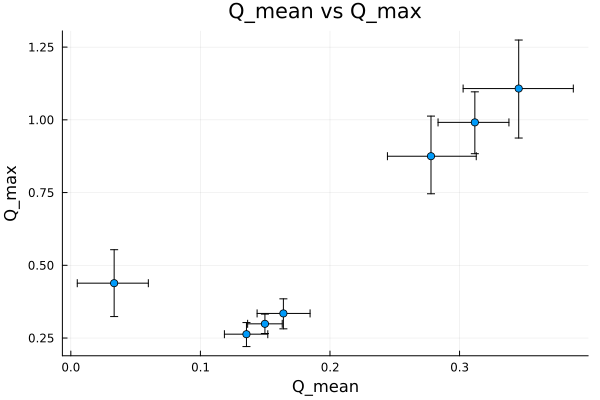

In [95]:
poly_plot = poly[:, [:Sinu, :W_avg_A, :DeltaH, :W_avg_measured, :Depth_avg, :AR_measured, 
                   :Grad_straight, :Grad_flow, :AR_A, :v_t1, :v_t2, :v_t3, :Q_mean, :Q_max]]

Makie.inline!(false)
# Get column names
column_names = names(poly_plot)

for i in 1:length(column_names)
    for j in i+1:length(column_names)  # Only plot unique pairs
        x_col = column_names[i]
        y_col = column_names[j]
        
        # Extract the columns
        x_data = poly_plot[!, x_col]
        y_data = poly_plot[!, y_col]
        
        # Filter out rows where either x or y is NaN
        valid_indices = .!isnan.(mean_object(x_data)) .&& .!isnan.(mean_object(y_data))
        x_filtered = x_data[valid_indices]
        y_filtered = y_data[valid_indices]

        # Create scatter plot for the pair of variables (only using filtered data)
        if length(x_filtered) > 0 && length(y_filtered) > 0
            Plots.scatter(x_filtered, y_filtered, 
                xlabel = string(x_col), ylabel = string(y_col), 
                title = string(x_col, " vs ", y_col),
                legend = false)

            # Display the plot
            display(current())  # Shows the plot
            # savefig("scatter_$x_col_$y_col.png")  # To save plots as files
        end
    end
end

In [82]:
# correlation matrix for all variables in poly_plot that don't have NaN values
poly_plot = poly[:, [:Sinu, :W_avg_A, :DeltaH, :W_avg_measured, :Depth_avg, :AR_measured, 
                   :Grad_straight, :Grad_flow, :AR_A]]

poly_plot_m = NamedArray(cor(Matrix(poly_plot)), (names(poly_plot), names(poly_plot)))
cor_matrix = Statistics.cor(poly_plot_m)
#convert to df in order to display
cor_df = DataFrame(cor_matrix, names(poly_plot))
DataFrames.names(cor_df, names(poly_plot))
cor_df = hcat(DataFrame(row_names = names(poly_plot)), cor_df)

Row,row_names,Sinu,W_avg_A,DeltaH,W_avg_measured,Depth_avg,AR_measured,Grad_straight,Grad_flow,AR_A
,String,Particle…,Particle…,Particle…,Particle…,Particle…,Particle…,Particle…,Particle…,Particle…
1,Sinu,1.0,0.0778 ± 0.2,0.262 ± 0.13,0.191 ± 0.14,-0.947 ± 0.031,0.698 ± 0.1,-0.247 ± 0.14,-0.388 ± 0.13,0.705 ± 0.14
2,W_avg_A,0.0778 ± 0.2,1.0,-0.435 ± 0.13,0.965 ± 0.025,0.0674 ± 0.16,0.707 ± 0.099,-0.738 ± 0.084,-0.72 ± 0.086,0.708 ± 0.076
3,DeltaH,0.262 ± 0.13,-0.435 ± 0.13,1.0,-0.434 ± 0.051,-0.261 ± 0.059,-0.231 ± 0.057,-0.148 ± 0.046,-0.171 ± 0.049,-0.213 ± 0.13
4,W_avg_measured,0.191 ± 0.14,0.965 ± 0.025,-0.434 ± 0.051,1.0,-0.0531 ± 0.081,0.806 ± 0.028,-0.779 ± 0.031,-0.777 ± 0.034,0.768 ± 0.075
5,Depth_avg,-0.947 ± 0.031,0.0674 ± 0.16,-0.261 ± 0.059,-0.0531 ± 0.081,1.0,-0.627 ± 0.058,0.0819 ± 0.086,0.225 ± 0.081,-0.641 ± 0.11
6,AR_measured,0.698 ± 0.1,0.707 ± 0.099,-0.231 ± 0.057,0.806 ± 0.028,-0.627 ± 0.058,1.0,-0.617 ± 0.064,-0.701 ± 0.054,0.979 ± 0.015
7,Grad_straight,-0.247 ± 0.14,-0.738 ± 0.084,-0.148 ± 0.046,-0.779 ± 0.031,0.0819 ± 0.086,-0.617 ± 0.064,1.0,0.988 ± 0.0032,-0.567 ± 0.12
8,Grad_flow,-0.388 ± 0.13,-0.72 ± 0.086,-0.171 ± 0.049,-0.777 ± 0.034,0.225 ± 0.081,-0.701 ± 0.054,0.988 ± 0.0032,1.0,-0.655 ± 0.1
9,AR_A,0.705 ± 0.14,0.708 ± 0.076,-0.213 ± 0.13,0.768 ± 0.075,-0.641 ± 0.11,0.979 ± 0.015,-0.567 ± 0.12,-0.655 ± 0.1,1.0


## Statistics fun
Linear models

In [92]:
#convert values of poly df to float
poly_temp = poly[:, [:Area, :Perimeter, :MaxDist, :FlowLength, :Sinu, :W_avg_A, :DeltaH, :W_avg_measured, :Depth_avg, :AR_measured, 
                   :Grad_straight, :Grad_flow, :AR_A, :v_t1, :v_t2, :v_t3, :Q_mean, :Q_max]] #removes name column
poly_float = DataFrame()
for i in names(poly_temp)
    poly_float[:, "$i"] = mean_object(poly_temp[:, "$i"])
end
poly_float

Row,Area,Perimeter,MaxDist,FlowLength,Sinu,W_avg_A,DeltaH,W_avg_measured,Depth_avg,AR_measured,Grad_straight,Grad_flow,AR_A,v_t1,v_t2,v_t3,Q_mean,Q_max
,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,216.029,269.845,123.679,133.922,1.08283,1.61365,3.101,1.70005,0.32492,5.40525,0.0250733,0.0231641,4.96691,1.28786,1.52238,0.457014,0.311805,0.991316
2,91.775,132.35,63.7152,65.1752,1.02298,1.40874,1.3,1.46029,0.349361,4.23986,0.0204045,0.0199548,4.03329,1.31914,2.23276,0.567752,0.27796,0.875015
3,124.583,140.837,63.1737,69.4186,1.09892,1.79552,1.801,1.86649,0.314347,6.12768,0.0285105,0.0259545,5.71328,1.29537,1.2075,0.390255,0.345649,1.10762
4,305.266,649.243,289.085,323.621,1.11947,0.943662,4.377,1.00005,0.2284,4.49653,0.0151409,0.0135305,4.13293,0.594889,0.881756,NaN,NaN,NaN
5,191.645,451.1,206.98,224.55,1.0849,0.853884,1.79,0.96699,0.227725,4.452,0.00864823,0.00797462,3.75317,NaN,1.4044,NaN,NaN,NaN
6,113.114,200.374,83.4826,99.1869,1.18815,1.14087,2.587,1.03309,0.222355,4.73651,0.0309896,0.0260936,5.13295,NaN,0.479509,NaN,0.0334332,0.438536
7,129.282,255.205,120.142,126.603,1.05379,1.02152,4.015,0.906336,0.270949,3.35653,0.0334193,0.0317254,3.77104,0.974147,1.27891,NaN,NaN,NaN
8,57.6592,114.581,52.7038,56.2905,1.06814,1.02469,2.071,0.874641,0.268354,3.27091,0.0392988,0.0368058,3.81973,NaN,1.4334,NaN,NaN,NaN
9,71.4163,143.047,67.5699,70.5237,1.04377,1.01299,1.944,0.940314,0.274186,3.44107,0.0287716,0.0275766,3.69563,NaN,1.20327,NaN,NaN,NaN


In [97]:
"""
colnames = names(poly_float)

for i in 1:length(colnames)
        for j in i+1:length(colnames)  # Only calculate unique pairs, efficient but not nice order
        #for j in 1:length(colnames)  #calculate every pair, inefficient but nice order
        x_col = colnames[j]
        y_col = colnames[i]

         # Create the formula by interpolating column names into a string and converting it to a formula
        formula = @eval @formula($(Symbol(y_col)) ~ $(Symbol(x_col)))
        
        model = lm(formula, poly_float)

        # Print or store the model (Here, we're printing the summary)
        println("\033[1mLinear model between $y_col and $x_col:\033[0m")
        println(model)
        println() 
    end
end
"""

LoadError: UndefVarError: `y_col` not defined

In [96]:
# do a linear regression for each pair

# Get column names from the DataFrame
colnames = names(poly_float)

for i in 1:length(colnames)
    for j in i+1:length(colnames)  # Only calculate unique pairs
        x_col = colnames[j]
        y_col = colnames[i]

        # Extract the columns as data
        x_data = poly_float[!, x_col]
        y_data = poly_float[!, y_col]

        # Filter out NaN values using mean_object
        valid_indices = .!isnan.(mean_object.(x_data)) .&& .!isnan.(mean_object.(y_data))
        x_filtered = x_data[valid_indices]
        y_filtered = y_data[valid_indices]

        # Create a new filtered DataFrame
        poly_filtered = DataFrame(x_filtered = x_filtered, y_filtered = y_filtered)

        # Only proceed if there are valid data points
        if nrow(poly_filtered) > 0
            # Create the formula dynamically
            formula = @eval @formula(y_filtered ~ x_filtered)

            # Fit the linear model
            model = lm(formula, poly_filtered)

            # Print the model summary
            println("\033[1mLinear model between $y_col and $x_col:\033[0m")
            println("$nrow(poly_filtered) valid observations")
            println(model)
            println()
        else
            println("Skipping pair $y_col and $x_col due to insufficient valid data.")
        end
    end
end

Linear model between Area and Perimeter:
StatsModels.TableRegressionModel{LinearModel{GLM.LmResp{Vector{Float64}}, GLM.DensePredChol{Float64, LinearAlgebra.CholeskyPivoted{Float64, Matrix{Float64}, Vector{Int64}}}}, Matrix{Float64}}

y_filtered ~ 1 + x_filtered

Coefficients:
────────────────────────────────────────────────────────────────────────
                 Coef.  Std. Error     t  Pr(>|t|)  Lower 95%  Upper 95%
────────────────────────────────────────────────────────────────────────
(Intercept)  19.6495    12.674      1.55    0.1450  -7.73105   47.03
x_filtered    0.451155   0.0486477  9.27    <1e-06   0.346058   0.556252
────────────────────────────────────────────────────────────────────────

Linear model between Area and MaxDist:
StatsModels.TableRegressionModel{LinearModel{GLM.LmResp{Vector{Float64}}, GLM.DensePredChol{Float64, LinearAlgebra.CholeskyPivoted{Float64, Matrix{Float64}, Vector{Int64}}}}, Matrix{Float64}}

y_filtered ~ 1 + x_filtered

Coefficients:
─────────────

In [104]:
using DataFrames, GLM, Statistics, Printf

# Get column names from the DataFrame
colnames = names(poly_float)

# Create a DataFrame to store results for significant models (p < 0.05)
results_df = DataFrame(y_col=String[], x_col=String[], p_value=Float64[], nrows=Int[], slope=Float64[])

for i in 1:length(colnames)
    for j in i+1:length(colnames)  # Only calculate unique pairs
        x_col = colnames[j]
        y_col = colnames[i]

        # Extract the columns as data
        x_data = poly_float[!, x_col]
        y_data = poly_float[!, y_col]

        # Filter out NaN values using mean_object
        valid_indices = .!isnan.(mean_object.(x_data)) .&& .!isnan.(mean_object.(y_data))
        x_filtered = x_data[valid_indices]
        y_filtered = y_data[valid_indices]

        # Create a new filtered DataFrame
        poly_filtered = DataFrame(x_filtered = x_filtered, y_filtered = y_filtered)

        # Only proceed if there are valid data points
        if nrow(poly_filtered) > 0
            # Create the formula dynamically
            formula = @eval @formula(y_filtered ~ x_filtered)

            # Fit the linear model
            model = lm(formula, poly_filtered)

            # Extract the p-value for the slope coefficient (x_filtered)
            p_values = coeftable(model).cols[4]  # p-values are stored in the 4th column of the coeftable
            p_value_x = p_values[2]  # [2] corresponds to the p-value of x_filtered (not the intercept)

            # Extract the slope coefficient for x_filtered
            coefficients = coeftable(model).cols[1]
            slope_x = coefficients[2]

            # Check if the p-value is less than 0.05
            if p_value_x < 0.05
                # Add the result to the results table
                push!(results_df, (y_col, x_col, p_value_x, nrow(poly_filtered), slope_x))

                # Print the model summary in red if p < 0.05
                println("\033[31m\033[1mLinear model between $y_col and $x_col:\033[0m")
                println(model)
                println("\033[31m\033[1mp-value for $x_col: $p_value_x\033[0m")
                println("\033[31m\033[1mslope coefficient for $x_col: $slope_x\033[0m")
                println("\033[31m\033[1mNumber of valid data points: $(nrow(poly_filtered))\033[0m")
                println()
            end

            if p_value_x >= 0.05

              push!(results_df, (y_col, x_col, p_value_x, nrow(poly_filtered), slope_x))
                
                  # Print the model summary in black
            println("\033[1mLinear model between $y_col and $x_col:\033[0m")
            println("$nrow(poly_filtered) valid observations")
            println(model)
            println()
            end
        else
            println("Skipping pair $y_col and $x_col due to insufficient valid data.")
        end
    end
end

# Print the results table for models with p < 0.05
println("\n\033[1mSignificant Models (p < 0.05):\033[0m")
println(results_df[results_df.p_value .< 0.05, :])

Linear model between Area and Perimeter:
StatsModels.TableRegressionModel{LinearModel{GLM.LmResp{Vector{Float64}}, GLM.DensePredChol{Float64, LinearAlgebra.CholeskyPivoted{Float64, Matrix{Float64}, Vector{Int64}}}}, Matrix{Float64}}

y_filtered ~ 1 + x_filtered

Coefficients:
────────────────────────────────────────────────────────────────────────
                 Coef.  Std. Error     t  Pr(>|t|)  Lower 95%  Upper 95%
────────────────────────────────────────────────────────────────────────
(Intercept)  19.6495    12.674      1.55    0.1450  -7.73105   47.03
x_filtered    0.451155   0.0486477  9.27    <1e-06   0.346058   0.556252
────────────────────────────────────────────────────────────────────────
p-value for Perimeter: 4.283051097794214e-7
slope coefficient for Perimeter: 0.45115470233180593
Number of valid data points: 15

Linear model between Area and MaxDist:
StatsModels.TableRegressionModel{LinearModel{GLM.LmResp{Vector{Float64}}, GLM.DensePredChol{Float64, LinearAlgebra.Chole

LoadError: MethodError: no method matching getindex(::DataFrame, ::BitVector)

[0mClosest candidates are:
[0m  getindex(::DataFrame, ::AbstractVector, [91m::Union{AbstractString, Signed, Symbol, Unsigned}[39m)
[0m[90m   @[39m [33mDataFrames[39m [90mC:\Users\herol\.julia\packages\DataFrames\kcA9R\src\dataframe\[39m[90m[4mdataframe.jl:530[24m[39m
[0m  getindex(::DataFrame, ::AbstractVector{T}, [91m::Colon[39m) where T
[0m[90m   @[39m [33mDataFrames[39m [90mC:\Users\herol\.julia\packages\DataFrames\kcA9R\src\dataframe\[39m[90m[4mdataframe.jl:605[24m[39m
[0m  getindex(::DataFrame, ::AbstractVector{T}, [91m::Union{Colon, Regex, All, Between, Cols, InvertedIndex, AbstractVector}[39m) where T
[0m[90m   @[39m [33mDataFrames[39m [90mC:\Users\herol\.julia\packages\DataFrames\kcA9R\src\dataframe\[39m[90m[4mdataframe.jl:579[24m[39m
[0m  ...


In [118]:
# Print the results table for models with p < 0.05
println("\n\033[1mAll Models:\033[0m")
println(results_df)


All Models:
153×5 DataFrame
 Row │ y_col           x_col           p_value      nrows  slope           
     │ String          String          Float64      Int64  Float64         
─────┼─────────────────────────────────────────────────────────────────────
   1 │ Area            Perimeter       4.28305e-7      15      0.451155
   2 │ Area            MaxDist         6.33339e-7      15      0.999649
   3 │ Area            FlowLength      4.28305e-7      15      0.902309
   4 │ Area            Sinu            0.547262        15    184.282
   5 │ Area            W_avg_A         0.546876        15     44.6154
   6 │ Area            DeltaH          0.0176476       15     43.8664
   7 │ Area            W_avg_measured  0.359342        15     55.8888
   8 │ Area            Depth_avg       0.63726         15   -198.933
   9 │ Area            AR_measured     0.389782        15     12.0473
  10 │ Area            Grad_straight   0.000837036     15  -4644.34
  11 │ Area            Grad_flow       0.

In [117]:
# Print the results table for models with p < 0.05
println("\n\033[1mSignificant Models (p < 0.05):\033[0m")
println(results_df[results_df.p_value .< 0.05, :])


Significant Models (p < 0.05):
46×5 DataFrame
 Row │ y_col           x_col           p_value      nrows  slope         
     │ String          String          Float64      Int64  Float64       
─────┼───────────────────────────────────────────────────────────────────
   1 │ Area            Perimeter       4.28305e-7      15      0.451155
   2 │ Area            MaxDist         6.33339e-7      15      0.999649
   3 │ Area            FlowLength      4.28305e-7      15      0.902309
   4 │ Area            DeltaH          0.0176476       15     43.8664
   5 │ Area            Grad_straight   0.000837036     15  -4644.34
   6 │ Area            Grad_flow       0.000503529     15  -5139.75
   7 │ Perimeter       MaxDist         2.60759e-16     15      2.22047
   8 │ Perimeter       FlowLength      0.0             15      2.0
   9 │ Perimeter       DeltaH          0.0180793       15     90.353
  10 │ Perimeter       Grad_straight   0.00212095      15  -9092.46
  11 │ Perimeter       Grad_flow  